# Rainfall Prediction Using Meterological Data

The Rain in Australia dataset contains about 10 years of daily weather observations from numerous Australian weather stations. 
Daily Weather Observations list observations of a number of weather elements each day for a month. Included are daily minimum and maximum temperature, rainfall, strongest wind gust, evaporation, and sunshine, together with values at 9am and 3pm of temperature, humidity, wind, cloud and pressure. These observations are originally taken from the Bureau of Meteorology's "real time" system. <p>

<b> AIM & OBJECTIVES</b>

The aim of this project is to use the data from Bureau of Meteorology to build a fully-automated system that can use today's weather data for a given location to predict whether it will rain at the same location the next day.

#### Data Source

The daily observations are available from <a href = 'http://www.bom.gov.au/climate/dwo/IDCJDW0000.shtml'> Commonwealth of Australia, Bureau of Meteorology</a> however, for this project, a sample of this original dataset on Kaggle wil be used to build the model </a>

## 1. Downloading Our Dataset from Kaggle

Using the opendatasets library to download the data from Kaggle directly within Jupyter by providing my Kaggle API key, and then using `os` to fetch the content in the downloaded directory

In [1]:
import opendatasets as od
import os

In [2]:
dataset_url = 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'

In [3]:
od.download(dataset_url)

Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


In [4]:
# Checking the content that's downloaded and extracted to the directory: weather-dataset-rattle-package

data_directory = './weather-dataset-rattle-package'
os.listdir(data_directory)

['weatherAUS.csv']

In [5]:
# locating the downloaded dataset inside the weather-dataset-rattle-package directory

weather_data = data_directory  + '/weatherAUS.csv'

## 2. Loading dataset into pandas & importing relevant libraries

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [7]:
weather_df = pd.read_csv(weather_data)
weather_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [8]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

The dataset contains over 145,460 rows and 23 columns. The dataset contains date, numeric and categorical columns. Our objective is to create a model to predict the value in the column RainTomorrow.

**2.1 Converting Date column to Datetime**

Taking a quick look at the above info from our dataset, we'll notice we have a date column which is labelled as a string i.e `object` datatype. Let's convert the column to its appropriate datatype.

In [9]:
weather_df['Date'] = pd.to_datetime(weather_df['Date'])
weather_df['Date'].dtype

dtype('<M8[ns]')

## 3. Exploratory Data Analysis & Visualizations

Here we'll leverage EDA to identify any obvious errors, better understand the patterns within the dataset, detect outliers or anomalous events, find interesting relations among the features and label, and generally, get a quick overview about our weather data before making any assumptions. <p> First, let's see the descriptive statistics of our dataset, and then check for missing values in the various columns in our dataset.
    
**3.1 Descriptive Statistics**


In [10]:
#View the descriptive statistics of the data
weather_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


**3.2 Checking for missing values in the various columns**

In [11]:
# Checking the columns that contains missing data

weather_df.columns[weather_df.isnull().any()]

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

Our target variable `RainTomorrow`appears to be among the columns with a missing data. 
Let's see the amount of data that's missing in the each column

In [12]:
weather_df.isna().sum().sort_values(ascending=False)

Sunshine         69835
Evaporation      62790
Cloud3pm         59358
Cloud9am         55888
Pressure9am      15065
Pressure3pm      15028
WindDir9am       10566
WindGustDir      10326
WindGustSpeed    10263
Humidity3pm       4507
WindDir3pm        4228
Temp3pm           3609
RainTomorrow      3267
RainToday         3261
Rainfall          3261
WindSpeed3pm      3062
Humidity9am       2654
WindSpeed9am      1767
Temp9am           1767
MinTemp           1485
MaxTemp           1261
Location             0
Date                 0
dtype: int64

In [13]:
weather_df.isna().sum().sort_values(ascending=False)[12:14]

RainTomorrow    3267
RainToday       3261
dtype: int64

We have 3267 missing data in our target variable `RainTomorrow`. While we should be able to fill in missing values for most columns, it's best we rid `RainTomorrow` and `RainToday` columns of any missing value to make our analysis and modeling simpler (since one of them is the target variable, and the other is likely to be very closely related to the target variable).

In [14]:
# Removing The Missing Data in 'RainToday' and 'RainToday' columns

weather_df.dropna(subset=['RainTomorrow','RainToday'], inplace=True)

In [15]:
weather_df.shape

(140787, 23)

After dropping the rows with missing values in `RainTomorrow` and `RainToday`our new weather dataset has now been reduced from 145,460 rows and 23 columns to 140,787 rows and 23 columns. But we not quite done yet. We still have some missing data in other columns so let's fix that after visualizing our data.

**3.3 Visualisation**

Before training preprocessing and ultimately training our machine learning model, let's explore the distributions of various columns and see how they are related to the target column. We'll explore and visualize the data using the Plotly, Matplotlib and Seaborn libraries which we've already imported.

In [16]:
import matplotlib
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (12, 9)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

Text(0, 0.5, 'Wind Speed 9am')

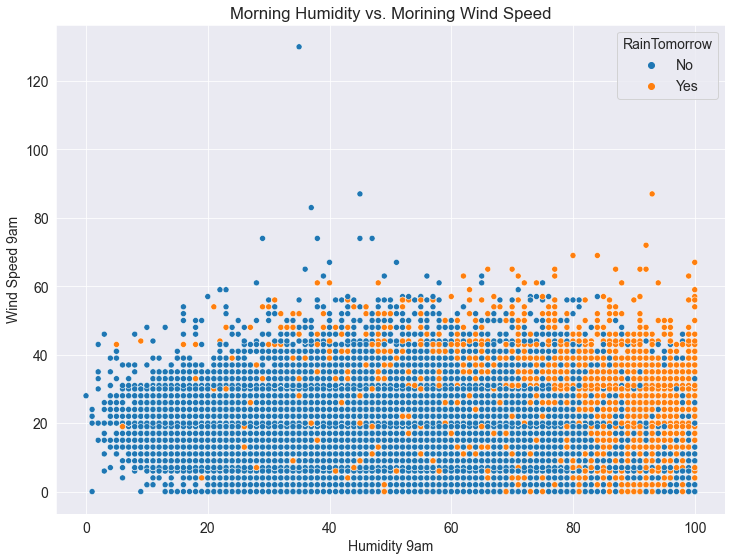

In [17]:
sns.scatterplot(data=weather_df, x='Humidity9am', y='WindSpeed9am', hue='RainTomorrow')
plt.title('Morning Humidity vs. Morining Wind Speed')
plt.xlabel('Humidity 9am')
plt.ylabel('Wind Speed 9am')


In [18]:
px.histogram(weather_df, x='Location', color='RainToday', title=' Location vs. Rainy Days')

In [19]:
px.histogram(weather_df, x='Temp3pm',title='Temperature at 3 pm vs. Rain Tomorrow', color='RainTomorrow')

In [20]:
px.histogram(weather_df, x='RainTomorrow', color='RainToday',title='Rain Tomorrow vs. Rain Today')

In [21]:
px.scatter(weather_df.sample(2000),title='Min Temp. vs Max Temp.',x='MinTemp', y='MaxTemp',color='RainToday')

In [22]:
px.scatter(weather_df.sample(2000),title='Temp (3 pm) vs. Humidity (3 pm)',x='Temp3pm',y='Humidity3pm',color='RainTomorrow')

Let's check the correelation between our features and target variable `RainTomorrow`

<AxesSubplot:>

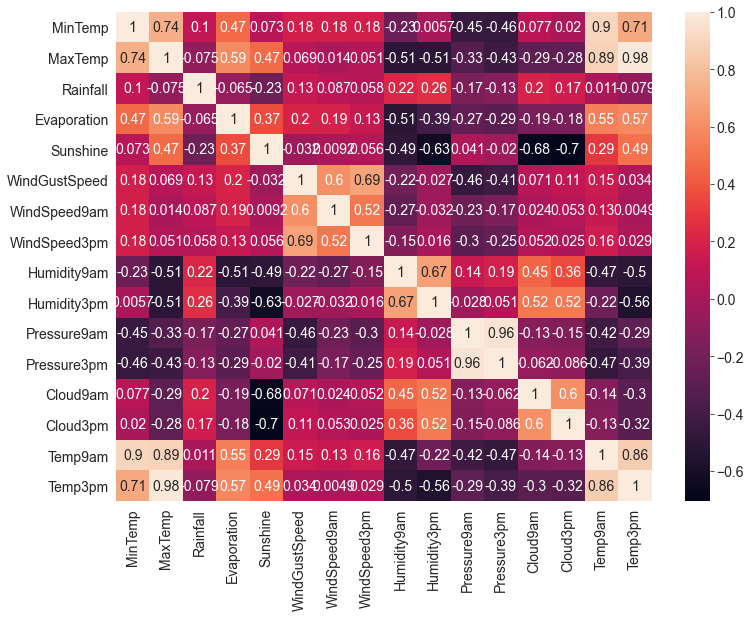

In [23]:
sns.heatmap(weather_df.corr(), annot=True)

**3.4 Put Numeric, Categorical, Datetime, and Target Variable column into seperate List**

This technique is utilised to enable us perform our EDA and Preprocessing with ease, and most of all, to make our code shorter

In [24]:
# Selecting the list of numeric columns in our dataset and then convert it to a list

numeric_col_list = weather_df.select_dtypes(include=np.number).columns.to_list()

In [25]:
# Select categorical columns, drop the Target Varibale and then convert to a list

categorical_col_list = weather_df.select_dtypes(include='object').drop('RainTomorrow', axis = 1).columns.to_list()

In [26]:
# Putting the Datetime column in a list

date_col_list = ['Date']

In [27]:
# Putting the column name of the target variable in a list

target_col_list = ['RainTomorrow']

**3.5 Filling The Missing Values In Our Dataset**

We've observed the columns with missing data and the number of missing data each column has. Now we'll use our discretion in fillig these missing data before we can use the data to carry out any analysis.





**3.5.1 Filling the missing columns of float datatype (numeric columns) in our dataset**

There are several techniques for imputation, but we'll use the most basic one: replacing missing values with the average value in the numeric column using the SimpleImputer class from sklearn.impute

In [28]:
from sklearn.impute import SimpleImputer

In [29]:
imputer = SimpleImputer(strategy='mean')

In [30]:
imputer.fit(weather_df[numeric_col_list])

SimpleImputer()

The missing values in the numeric columns of our dataset is now filled using the transform method of imputer.

In [31]:
weather_df[numeric_col_list] = imputer.transform(weather_df[numeric_col_list])

**3.5.2 Filling the missing data in our categorical column with 'unknown'**

In [32]:
weather_df[categorical_col_list] = weather_df[categorical_col_list].fillna('unknown')

In [33]:
# Checking if all the missing values in dataset has been poperly filled
weather_df.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

## 4. Preprocessing

**4.1 Encoding Categorical Variables**

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns. One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column.

In [34]:
#Checking the number of unique values in each categorical data

weather_df[categorical_col_list].nunique()

Location       49
WindGustDir    17
WindDir9am     17
WindDir3pm     17
RainToday       2
dtype: int64

In [35]:
from sklearn.preprocessing import OneHotEncoder

In [36]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [37]:
encoder.fit(weather_df[categorical_col_list])

OneHotEncoder(handle_unknown='ignore', sparse=False)

After calling .fit on our categorical column, the encoder created a list of categories for each of the categorical columns in the dataset. We can generate column names for each individual category using `get_feature_names` and then convert it to list

In [38]:
encoded_categorical_col_list = list(encoder.get_feature_names(categorical_col_list))
print(encoded_categorical_col_list)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

To perform the encoding itself, we'll use the .transform method of encoder on the categorical data

In [39]:
weather_df[encoded_categorical_col_list] = encoder.transform(weather_df[categorical_col_list])

**4.2 Merge The Numeric, Datetime, Encoded_Categorical, and Target Variable Columns into one Dataframe**

In [40]:
weather_data = weather_df[date_col_list + encoded_categorical_col_list + numeric_col_list + target_col_list]

**4.3 Working With a Sample**

When working with massive datasets containing millions of rows, it's a good idea to work with a sample initially, to quickly set up your model training notebook. If you'd like to work with a sample, just set the value of `use_sample` to True.

Since we're using our entire dataset to train the model we'll assign Fasle to `use_sample`

In [41]:
use_sample = False
sample_fraction = 0.1

In [42]:
#if use_sample = True, use this sampled dataset as our new weather_data, if not use the original weather_data

if use_sample:
    weather_data = weather_data.sample(frac=sample_fraction)

**4.4 Training, Validation and Test Sets**


While building real-world machine learning models, it is quite common to split the dataset. So we'll split our dataset into three parts: We'll use 60% of the data for the training set, 20% for the validation set and 20% for the test set.

Training Set - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique.

Validation Set - used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model.

Test Set - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.

In [43]:
from sklearn.model_selection import train_test_split

Splitting the data: 60% of the data for the training set, 20% for the validation set and 20% for the test set.

In [44]:
# Dividing the data into Train__Validation and Test set (20%) 1st

train_val_df, test_df = train_test_split(weather_data, test_size = 0.2, random_state=42)

In [46]:
#Further splitting Train_Validation into Train_df and Validation_df (25%)

train_df, val_df = train_test_split(train_val_df, test_size =0.25, random_state= 42)

Checking the shape/size of the newly splitted Train, Validation, and Test set from our original dataset `weather_df`

In [47]:
print('The shape of the train_df :', train_df.shape)
print('The shape of the val_df :', val_df.shape)
print('The shape of the test_df:', test_df.shape)

The shape of the train_df : (84471, 120)
The shape of the val_df : (28158, 120)
The shape of the test_df: (28158, 120)


We've splitted our data into 3 parts: `train_df`, `val_df`, and `test_df` with each dataset having 120 columns after we used onehot encoding to encode the categorical columns. However, recall we have a Date column in our dataset. And while working with dates, it's often a better idea to separate the training, validation and test sets with time, so that the model is trained on data from the past and evaluated on data from the future.

**4.4.1 Splitting the Test set and Validation set with respect to time**

From the current `weather_data` dataset, we'll now use the `Date` column we converted to datetime to extract year; just so we can pick the last two years for the test set `test_df`, and one year before it for the validation set `val_df`.

Text(0.5, 1.0, 'No. of Weather Data Collected per Year')

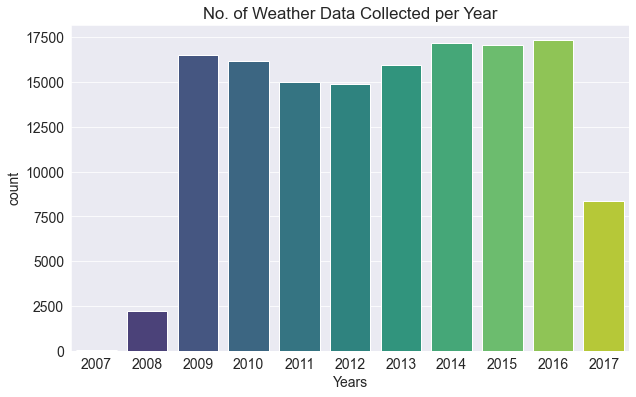

In [48]:
plt.figure(figsize=(10,6))
year = weather_data['Date'].dt.year
sns.countplot(x=year, palette='viridis')
plt.xlabel('Years')
plt.title('No. of Weather Data Collected per Year')

This weather dataset was collected for 10 years; it spanned from the year 2007 to 2017. So we'll pick the last two years ( 2017 and 2016) for the test set, year 2015 as the validation set, and year 2007 to 2014 will be used as out train set. We'll equally drop `Date` column in all sets because we don't need it anymore.

In [49]:
train_df = weather_data[year < 2015].drop('Date', axis=1)
val_df = weather_data[year == 2015].drop('Date', axis=1)
test_df = weather_data[year > 2015].drop('Date', axis=1)

In [50]:
train_df.head()

,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.49925,16.9,21.8,No
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,22.0,44.0,25.0,1010.6,1007.8,4.431161,4.49925,17.2,24.3,No
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,26.0,38.0,30.0,1007.6,1008.7,4.431161,2.00000,21.0,23.2,No
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9.0,45.0,16.0,1017.6,1012.8,4.431161,4.49925,18.1,26.5,No
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.00000,17.8,29.7,No


Checking the shape of the newly splitted Train, Validation, and Test set from our dataset `weather_data` after dropping the `Date` column

In [51]:
print('The new shape of train_df:', train_df.shape)
print('The new shape of val_df:', val_df.shape)
print('The new shape of test_df:', test_df.shape)

The new shape of train_df: (97988, 119)
The new shape of val_df: (17089, 119)
The new shape of test_df: (25710, 119)


**4.5 Feature Scaling**

As we can see below, the numeric columns of our dataset has varying ranges -- mostly because each feature has a different metrics of measurement. For example, temperature is measured in celscuis, windGust in knots, pressure in pascal etc. Thence, more reason why we have to scale the numeric columns to give each feature a level playing field. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers, so we'll scale numeric features to a small range of values between 0 and 1.

In [52]:
weather_data[numeric_col_list].describe().loc[['max','min']]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
max,33.9,48.1,371.0,145.0,14.5,135.0,130.0,87.0,100.0,100.0,1041.0,1039.6,9.0,9.0,40.2,46.7
min,-8.5,-4.8,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,980.5,977.1,0.0,0.0,-7.2,-5.4


To scale the numeric data in our dataset, we'll use the MinMaxScaler by calling the `.fit` on the train data only `train_df` and subsequently, calling the `.transform` on all the three datasets `train_df`, `val_df`, and `test_df`

In [53]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [54]:
scaler.fit(train_df[numeric_col_list])

MinMaxScaler()

In [55]:
train_df[numeric_col_list] = scaler.transform(train_df[numeric_col_list])
val_df[numeric_col_list] = scaler.transform(val_df[numeric_col_list])
test_df[numeric_col_list] = scaler.transform(test_df[numeric_col_list])

Checking to see if the numeric features was succesfully scaled between the range of 0 and 1

In [56]:
pd.set_option('display.max_columns',None)
train_df.describe().loc[['min','max']]

,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_unknown,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_unknown,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_unknown,RainToday_No,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


As we can see from the `train_df` dataframe above, all the features in our dataset has successfully been scaled between 0 and 1. The features in the validation and test set has equally been scaled. Next, we need to extract our target column `RainTomorrow` from each of the 3 datasets `train_df`,`val_df`, `test_df`

**4.6 Split The Dataset Into Input Variable (x) and Target Variable (y)**

In [57]:
trainDF_X = train_df.drop('RainTomorrow', axis=1)
trainDF_Y = train_df['RainTomorrow']

valDF_X = val_df.drop('RainTomorrow', axis=1)
valDF_Y = val_df['RainTomorrow']

testDF_X = test_df.drop('RainTomorrow', axis=1)
testDF_Y = test_df['RainTomorrow']

In [58]:

print('The shape of input features (x)from trainDF is:', trainDF_X.shape)
print('The shape of the response variable (y) from trainDF is:', trainDF_Y.shape)

print('The shape of the input features (x) from trainDF is:', valDF_X.shape)
print('The shape of the response variable (y) from trainDF is:', valDF_Y.shape)

print('The shape of the input features from (x) trainDF is:', testDF_X.shape)
print('The shape of the response variable (y) from trainDF is:', testDF_Y.shape)


The shape of input features (x)from trainDF is: (97988, 118)
The shape of the response variable (y) from trainDF is: (97988,)
The shape of the input features (x) from trainDF is: (17089, 118)
The shape of the response variable (y) from trainDF is: (17089,)
The shape of the input features from (x) trainDF is: (25710, 118)
The shape of the response variable (y) from trainDF is: (25710,)


**4.7 Saving Processed Data to Disk**


While many might probably find this not very much useful, I personally think it can be useful to save our processed data to disk; especially for really large datasets. This is to avoid repeating the preprocessing steps every time we start the Jupyter notebook. This can be acheived by either saving to parquet or csv. I find using the `to_parquet` format quite faster and more efficient than `to_csv` for saving and loading Pandas dataframes.

parquet is in pyarrow library. And pyarrow can be installed by runing this `!pip install pyarrow --quiet` on your jupyter notebook.

**4.7.1 Saving preprocessed data**

In [59]:
%%time
pd.DataFrame(trainDF_X).to_parquet('train_inputs.parquet')
pd.DataFrame(valDF_X).to_parquet('val_inputs.parquet')
pd.DataFrame(testDF_X).to_parquet('test_inputs.parquet')

pd.DataFrame(trainDF_Y).to_parquet('train_target.parquet')
pd.DataFrame(valDF_Y).to_parquet('val_target.parquet')
pd.DataFrame(testDF_Y).to_parquet('test_target.parquet')

Wall time: 9.88 s


**4.7.2 Loading the saved preprocessed data**

Since we saved our train, val, and test sets in DataFrame using `to_parquet`, we'll have to reshape all target dataframe to a 1-dimensional numpy array 

In [60]:
%%time

x_train = pd.read_parquet('train_inputs.parquet')
y_train = np.array(pd.read_parquet('train_target.parquet')).reshape(-1)

x_val = pd.read_parquet('val_inputs.parquet')
y_val = np.array(pd.read_parquet('val_target.parquet')).ravel()

x_test = pd.read_parquet('test_inputs.parquet')
y_test = np.array(pd.read_parquet('test_target.parquet')).reshape(-1)

Wall time: 5.67 s


## 5. Model Training and Prediction

In [61]:
from sklearn.linear_model import LogisticRegression

In [62]:
logreg = LogisticRegression(solver='liblinear')

In [63]:
logreg.fit(x_train, y_train)

LogisticRegression(solver='liblinear')

In [64]:
train_pred = logreg.predict(x_train)

In [65]:
train_pred

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [66]:
# Output a probabilistic prediction

train_proba = logreg.predict_proba(x_train)

In [67]:
train_proba

array([[0.94422004, 0.05577996],
       [0.94068272, 0.05931728],
       [0.96113894, 0.03886106],
       ...,
       [0.98755353, 0.01244647],
       [0.98340664, 0.01659336],
       [0.8750756 , 0.1249244 ]])

The numbers above indicate the probabilities for the target classes "No" and "Yes"

**5.1 Checking Model Performance with Accuracy Score**

We'll can test the accuracy of the model's predictions by computing the percentage of matching values in train_pred and y_train. Then use `confusion_matrix` visualize correctly and incorrectly classified input

In [68]:
from sklearn.metrics import accuracy_score, confusion_matrix

In [69]:
accuracy_score(y_train, train_pred)

0.8519920806629383

The model achieves an accuracy of 85.2% on the training set. We can visualize the breakdown of correctly and incorrectly classified inputs using a confusion matrix

In [70]:
confusion_matrix(y_train, train_pred, normalize='true')

array([[0.94625279, 0.05374721],
       [0.477475  , 0.522525  ]])

**5.2 Model Performance Visualization**


Let's define a helper function to generate predictions, compute the accuracy score and plot a confusion matrix for any given input

In [71]:
def plot_predict(X, Y, name= ''):
    Y_preds = logreg.predict(X)
    
    accuracy = accuracy_score(Y, Y_preds)
    print('Accuracy Score: {:.2f}%'.format(accuracy*100))
    
    cfm = confusion_matrix(Y,Y_preds, normalize='true')
    plt.figure()
    sns.heatmap(cfm,annot=True)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('{} Confusion Matrix'.format(name))
    
    return Y_preds

Accuracy Score: 85.20%


array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

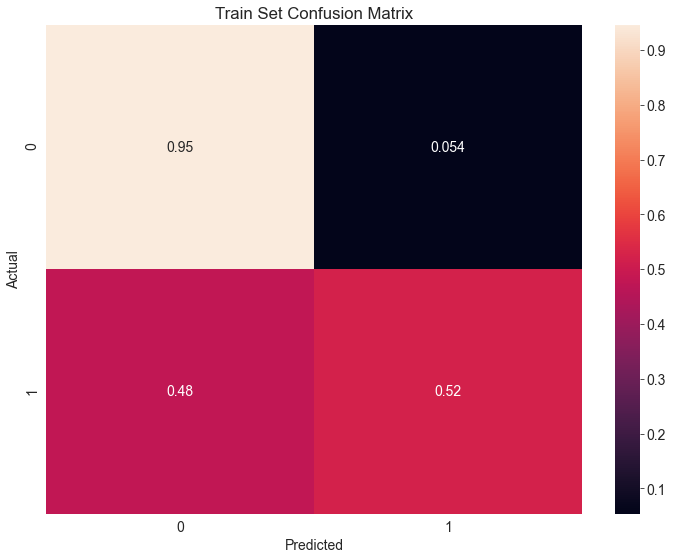

In [72]:
plot_predict(x_train, y_train, 'Train Set')


From the above confusion matrix we can observe that our

**00 == TN** = 0.95 (True Negative)

**01 == FP** = 0.05 (False Positive / Type I Error)

**10 == FN** = 0.48 (False Positive / Type II Error)

**11 == TP** = 0.52 (True Positive)

We can see that our train set was able to correctly classify the 'No' class (`True Negative`) with 95% accuracy, and the 'Yes' class (`True Positive`) with 54% accuracy. This means that our model correctly predicted when it's not gonna rain 95% of the time while it correctly predicted when it's gonna rain by 52%.

Our  major concern should really be focused on the False Positive and False Negative with 5% and 48% respectively. what this implies is that our model predicted it will rain when it's not going to rain 5% of the time, and then it predicted it will not rain 48% of the time when it's truly suppose to rain.

Depending on the event, basing our decision on this model;

a) Perhaps when deciding to host an open event show, this can be so disastrous because preparations would be made based on model's falsely predicting it's not going to rain with 48% assurance. Things might not pan out well because there's every possibility the event show will be ruined due to rain since our model fasely predicted 'No Rainfall' when it's supposed to rain 48% of the time.

b)Same thing applies when our model falsely predicted it's gonna rain  5% of the timebbut in essence it's not gonna rain. There won't be much damage in this scenario as compared to (a), it'll only make make people dissappointed becuase they'll come out with their umbrellas and still not have need for it because our model faslely predicted it will rain.

In [73]:
# Adding our confusion matrix into a DataFrame to make it more easier to understand

cm = confusion_matrix(y_train, train_pred, normalize='true')*100

pd.DataFrame(cm, index=['No Rainfall','Rainfall'], columns=['Predicted No Rainfall', 'Predicted Rainfall']).round(2)

,Predicted No Rainfall,Predicted Rainfall
No Rainfall,94.63,5.37
Rainfall,47.75,52.25


**5.3 Cross Validation**

Measuring model performnace with accuracy -- that is, the fraction of correctly classified samples using accuracy as the model performance metrics in a classification problem isn't always a useful metrics. This is becuase, accuracy as a model performance metrics has a pitfall known as Class Imbalance problem.
In our RainFall Prediction classification as seen below, we'll notice the `No` rainfall class contains way more instances (77.8%) than the `Yes` 'there'll be a rainfall' class which is (22.2%)

In [74]:
weather_df[target_col_list].value_counts(normalize=True)*100

RainTomorrow
No              77.838153
Yes             22.161847
dtype: float64

In essence, Accuracy is best when the number of observations in each class is the same. so to get a hint on how well our model generalize, we'll used cross validation score with 5-folds

In [75]:
 from sklearn.model_selection import cross_val_score

In [76]:
cv_result = cross_val_score(logreg, x_train, y_train, cv=5)
print(cv_result)

[0.83049291 0.81845086 0.72058373 0.77266929 0.84594581]


In [77]:
np.mean(cv_result)

0.7976285193906945

**5.4 Improving The Model By Finding The Best Hyper-Parameter With GridSearchCV**

In [103]:
from sklearn.model_selection import GridSearchCV

In [110]:
c_space = np.logspace(-5, 8, 15)
param = {'C': c_space,'penalty':['l1','l2']}

In [111]:
model = LogisticRegression(solver='liblinear')

In [112]:
grid = GridSearchCV(model, param_grid = param, cv=5)

In [113]:
grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(solver='liblinear'),
             param_grid={'C': array([1.00000000e-05, 8.48342898e-05, 7.19685673e-04, 6.10540230e-03,
       5.17947468e-02, 4.39397056e-01, 3.72759372e+00, 3.16227766e+01,
       2.68269580e+02, 2.27584593e+03, 1.93069773e+04, 1.63789371e+05,
       1.38949549e+06, 1.17876863e+07, 1.00000000e+08]),
                         'penalty': ['l1', 'l2']})

In [114]:
print('The best parameter is {}'.format(grid.best_params_))

The best parameter is {'C': 0.006105402296585327, 'penalty': 'l1'}


In [115]:
print('The best score is {}'.format(grid.best_score_))

The best score is 0.8408888261652209


GridSearch didn't do much to help here since the best Score from GridSearch (0.8409) is less than our initial model accuracy score (0.8520). Hence I ignored using the result to tune the hyperparameters in our model which is ordinarily would have be done as given below

**5.5 Hyperparameter Tuning**

In [151]:
#logreg = LogisticRegression(solver='liblinear', penalty='l1', C = 0.006105402296585327)
#logreg.fit(x_train, y_train)

LogisticRegression(C=0.006105402296585327, penalty='l1', solver='liblinear')

**5.6 Predicting on Validation & Test Set**

Let's use plot_predict function we created to generate predictions, compute the accuracy score and plot a confusion matrix for validation and test set

Accuracy Score: 85.41%


array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

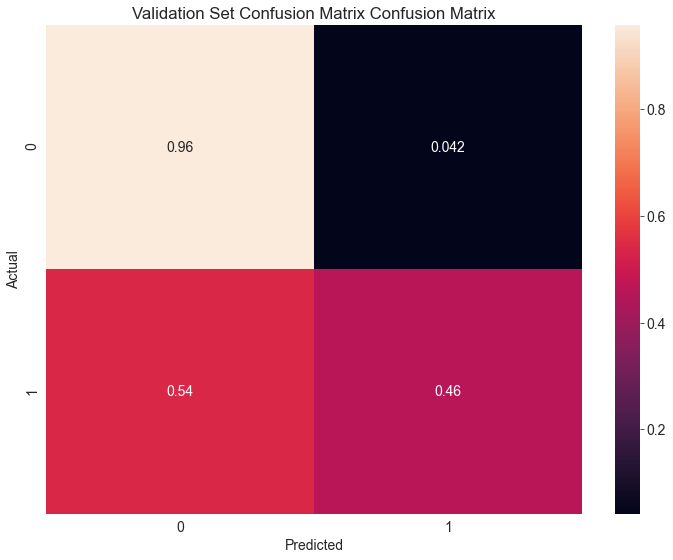

In [172]:
plot_predict(x_val, y_val, 'Validation Set Confusion Matrix')

Accuracy Score: 84.19%


array(['No', 'No', 'Yes', ..., 'No', 'No', 'No'], dtype=object)

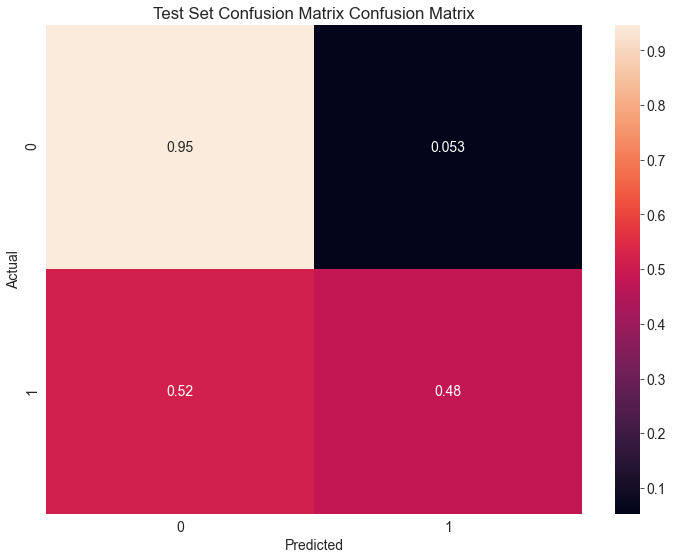

In [173]:
plot_predict(x_test, y_test, 'Test Set Confusion Matrix')

The accuracy of the model on the test and validation set are above 84%, which suggests that our model generalizes well to data it hasn't seen before.

But how good is 84% accuracy? While this depends on the nature of the problem and on business requirements, a good way to verify whether a model has actually learned something useful is to compare its results to a "random" or "dumb" model.

## 6. Benchmark Model

Here we'll try to verify whether our model has actually learned something useful by creating a `dumb` or `random guess` model. 
Let's create two models: one that guesses randomly and another that always return "No". Both of these models completely ignore the inputs given to them.

In [174]:
def random_guess(inputs):
    return np.random.choice(['Yes', 'No'], len(inputs))

In [175]:
def all_no(inputs):
    return np.full(len(inputs), 'No')

Checking the accuracy score of the two models on the test set

In [177]:
accuracy_score(y_test, random_guess(x_test))

0.49894982497082846

In [178]:
accuracy_score(y_test, all_no(x_test))

0.7734344612991054

Our random model achieves an accuracy of 50% and our "always No" model achieves an accuracy of 77%.

Thankfully, our model is better than a "dumb" or "random" model! This is not always the case, hence the reason I think it's a good practice to benchmark any model we train against such baseline models.

## 7. Making Rainfall Predictions on a Single Input
 
A model accuracy score of 84.19% is probablly not the most desirable score, we'll have to tune our hyperparameters, try out some other strategy for filling missing values, or even dropping some columns to see if we can improve the accuracy score of the model.Once our model has been trained to a satisfactory accuracy, it can be used to make predictions on new data. 


Making a prediction with the following dictionary containing data collected from the Katherine weather department.

In [181]:
new_input = {'Date': '2021-06-19',
             'Location': 'Katherine',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

Converting the dictionary into a Pandas dataframe, similar to `weather_data`

In [193]:
new_input_df = pd.DataFrame([new_input])
new_input_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2021-06-19,Katherine,23.2,33.2,10.2,4.2,NaN,NNW,52.0,NW,NNE,13.0,20.0,89.0,58.0,1004.8,1001.5,8.0,5.0,25.7,33.0,Yes


We've now created a Pandas dataframe with the same columns as `weather_df` (except `RainTomorrow`, which needs to be predicted). The dataframe contains just one row of data, containing the given input.


We must now apply the same transformations applied while training the model:

1. Imputation of missing values using the `imputer` created earlier
2. Scaling numerical features using the `scaler` created earlier
3. Encoding categorical features using the `encoder` created earlier

In [202]:
new_input_df[numeric_col_list] = imputer.transform(new_input_df[numeric_col_list])
new_input_df[numeric_col_list] = scaler.transform(new_input_df[numeric_col_list])
new_input_df[encoded_categorical_col_list] = encoder.transform(new_input_df[categorical_col_list])

In [289]:
x_new_df = new_input_df[numeric_col_list+encoded_categorical_col_list]
x_new_df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_unknown,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_unknown,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_unknown,RainToday_No,RainToday_Yes
0,0.205616,0.080311,1.997462e-07,0.000008,0.002609,-0.046851,0.00002,0.00003,0.000089,0.000058,-16.47438,-16.4216,0.010974,0.006859,0.131081,0.101839,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


**7.1 Making Predictions**

In [349]:
prediction = logreg.predict(x_new_df)[0]

print('Will it rain in Katherine tomorrow ? :', prediction)

Will it rain in Katherine tomorrow ? : No


Our model predicts that it will not rain in Katherine tomorrow! Let's check the probability of the prediction.

In [350]:
prob = logreg.predict_proba(x_new_df)[0]
prob

array([0.61229616, 0.38770384])

it seems our model isn't too pretty sure of its predictions

**7.2 Let's create a helper function to make predictions for individual inputs**

In [363]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_col_list] = imputer.transform(input_df[numeric_col_list])
    input_df[numeric_col_list] = scaler.transform(input_df[numeric_col_list])
    input_df[encoded_categorical_col_list] = encoder.transform(input_df[categorical_col_list])
    X_input = input_df[numeric_col_list + encoded_categorical_col_list]
    pred = logreg.predict(X_input)[0]
    prob = logreg.predict_proba(X_input)[0][list(logreg.classes_).index(pred)]
    return pred, prob

We can now use this function to make predictions for individual inputs.

In [364]:
new_input1 = {'Date': '2021-06-19',
             'Location': 'Katherine',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [365]:
predict_input(new_input1)

('Yes', 0.9467305605460635)

## 8. Saving and Loading Trained Models

We can save the parameters (weights and biases) of our trained model to disk, so that we needn't retrain the model from scratch each time we wish to use it. Along with the model, it's also important to save imputers, scalers, encoders and even column names. Anything that will be required while generating predictions using the model should be saved.

We can use the `joblib` module to save and load Python objects on the disk.

In [366]:
import joblib

 Creating a dictionary containing all the required objects.

In [369]:
australian_rain = {
    'model':logreg, 
    'imputer': imputer, 
    'scaler': scaler, 
    'encoder': encoder, 
    'numeric_col': numeric_col_list,
    'target_col': target_col_list,
    'categorical_col': categorical_col_list,
    'encoded_col': encoded_categorical_col_list
}

In [371]:
#Saving this to a file using joblib.dump

joblib.dump(australian_rain, 'rain_pred.joblib')

['rain_pred.joblib']

In [372]:
# Loading the file

rain_pred = joblib.load('rain_pred.joblib')

Let's use the loaded model to make predictions on the original test set.

In [373]:
test_pred = rain_pred['model'].predict(x_test)
accuracy_score(y_test, test_pred)

0.8418903150525088

As expected, we got the same result as the original model.

# What Next?


I'll try training our model with Decision Tree, Random Forest, and Xgboost to see if there'll be a significant improvement in the model accuracy